In [1]:
# set environment for better memory menagment
import os
import jax

platform = os.getenv("JAX_PLATFORM_NAME", "gpu")
jax.config.update("jax_platform_name", platform)

os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
os.environ["XLA_PYTHON_CLIENT_ALLOCATOR"] = "platform"

In [2]:
# import packages and set environment
import sys
import string

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import jax.numpy as jnp
from jax.nn import softmax

from tqdm import tqdm

from matplotlib import cm, colors

from stats import trials_until_correct, trials_until_explore, running_mean, performance

from scipy import io

from jupyterthemes import jtplot
jtplot.style(theme='grade3', context='paper', fscale=1.6, grid=False)

# append current directory to sys path
cwd = os.getcwd()
sys.path.append(cwd[:-len('befit/examples/temp_rev_learn')])

%matplotlib inline

In [3]:
# load experimental states and observations
states_and_rewards = io.loadmat('main/states_and_rewards.mat')
Sirr = states_and_rewards['irregular']['S'][0, 0][:, 0] - 1
Oirr = states_and_rewards['irregular']['R'][0, 0]
Sreg = states_and_rewards['regular']['S'][0, 0][:, 0] - 1
Oreg = states_and_rewards['regular']['R'][0, 0]

In [4]:
# import data loader
from stats import load_data

# load behavioural data
outcomes_data, responses_data, mask_data, counts, correct_choices_data, conditions = load_data()

nsub, ns_reg, ns_irr = counts

pilot = conditions.experiment == 'pilot'
ns_pilot = sum(pilot)
ns_pilot_reg = sum( conditions.loc[pilot, 'condition'] == 'regular')
ns_pilot_irr = sum( conditions.loc[pilot, 'condition'] == 'irregular')
print(' Total number of subjects is {}, of which {} where asigned to regular condition and {} where tested during a pilot study (without exploration option). In the pilot study {} subjects where asigned to the regular condition.'.format(nsub, ns_reg, ns_pilot, ns_pilot_reg))

 Total number of subjects is 74, of which 41 where asigned to regular condition and 24 where tested during a pilot study (without exploration option). In the pilot study 14 subjects where asigned to the regular condition.


In [ ]:
import glob
waics = {}
samples = {}
for filename in sorted(glob.glob('fit_waic_sample/fit_waic_sample_minf*.*')):
    fits = np.load(filename, allow_pickle=True)
    m = int(filename.split('_')[-1].split('.')[0].split('f')[-1])
    print(m, filename)
    waics[m] = fits['waic']
    samples[m] = fits['samples'].item()

waic_array = np.zeros((len(waics), nsub))
for m in sorted(waics.keys()):
    waic_array[m-1] = waics[m]
    
probs = softmax(waic_array, 0).T
gammas = []
lambdas = []
for i, m in enumerate(probs.argmax(-1)):
    smpl = samples[m+1]
    gammas.append( smpl['gamma'][..., i] )
    lambdas.append( smpl['lams'][..., i, :] )
    
gammas = np.stack(gammas, -1)
lambdas = np.stack(lambdas, -2)

In [5]:
fits = np.load('fit_waic_sample/fit_sample_mixture_gamma1_pref_0.npz', allow_pickle=True)
samples = fits['samples'].item()
    
weights = samples['weights']
gammas = samples['gamma_dyn']
lambdas = np.log(samples['p0'])

In [6]:
fits = np.load('fit_waic_sample/fit_sample_mixture_gamma0_pref_0.npz', allow_pickle=True)
samples2 = fits['samples'].item()
    
weights2 = samples2['weights']
gammas2 = samples2['gamma']
lambdas2 = np.log(samples2['p0'])

In [8]:
fits = np.load('fit_waic_sample/fit_sample_mixture_gamma0_pref_0_short.npz', allow_pickle=True)
samples3 = fits['samples'].item()
    
weights3 = samples3['weights']
gammas3 = samples3['gamma']
lambdas3 = np.log(samples3['p0'])

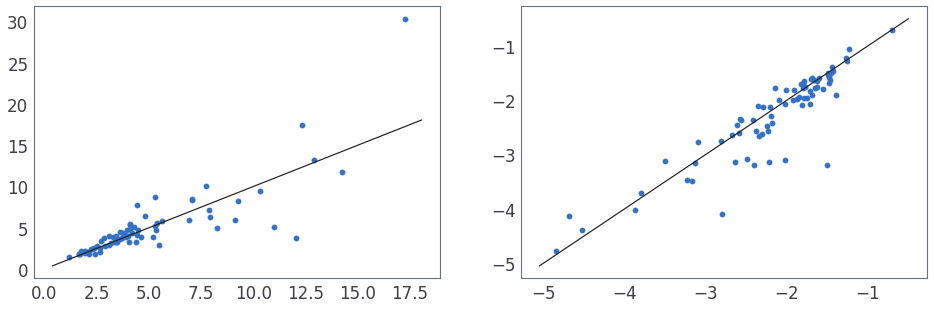

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

axes[0].scatter(gammas2.mean(-1), gammas3.mean(-1))
axes[0].plot(axes[0].get_xlim(), axes[0].get_xlim(), 'k')

axes[1].scatter(lambdas2.mean(-2)[..., 0], lambdas3.mean(-2)[..., 0])
axes[1].plot(axes[1].get_xlim(), axes[1].get_xlim(), 'k')

<AxesSubplot:>

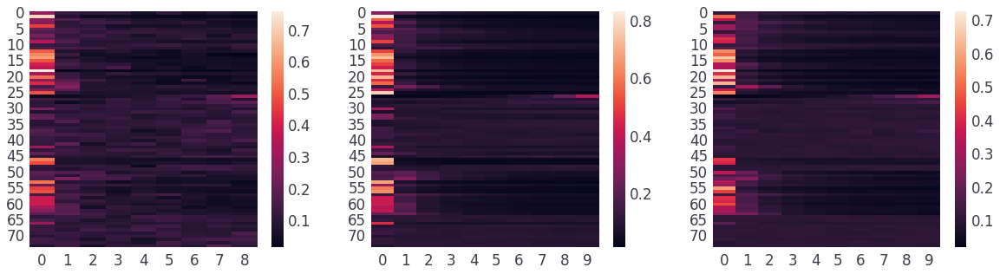

In [18]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

sns.heatmap(weights.mean(-2), ax=axes[0])
sns.heatmap(weights2.mean(-2), ax=axes[1])
sns.heatmap(weights3.mean(-2), ax=axes[2])

In [21]:
fits = np.load('fit_waic_sample/fit_waic_sample_minf10_gamma0_pref0.npz', allow_pickle=True)
samples4 = fits['samples'].item()

fits = np.load('fit_waic_sample/fit_waic_sample_minf1_gamma0_pref0.npz', allow_pickle=True)
samples5 = fits['samples'].item()

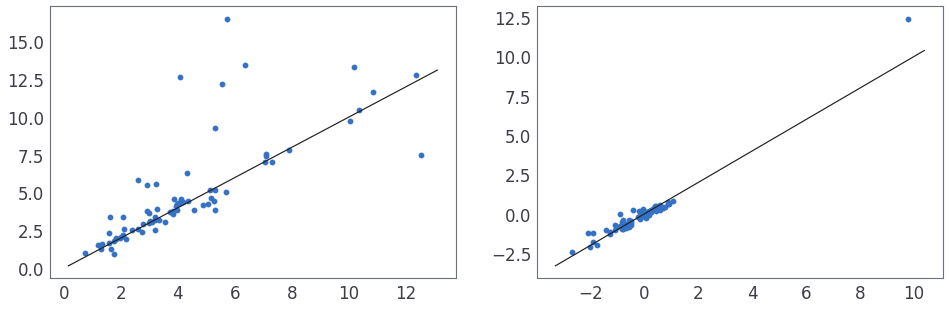

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

axes[0].scatter(samples4['gamma'].mean(-1), samples5['gamma'].mean(-1))
axes[0].plot(axes[0].get_xlim(), axes[0].get_xlim(), 'k')

axes[1].scatter(np.log(samples4['lam12']).mean(-2)[..., 0], np.log(samples5['lam12']).mean(-2)[..., 0])
axes[1].plot(axes[1].get_xlim(), axes[1].get_xlim(), 'k')

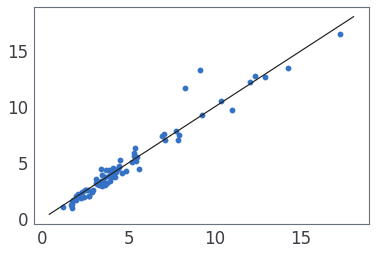

In [29]:
plt.scatter(gammas2.mean(-1), samples5['gamma'].mean(-1))
plt.plot(plt.xlim(), plt.xlim(), 'k')

In [30]:
out_reg = jnp.concatenate([(Oreg + 1)//2, 
                             Sreg[:, None] + 2], -1)

out_irr = jnp.concatenate([(Oirr + 1)//2, 
                             Sirr[:, None] + 2], -1)

ws = 201
perf_data = performance(correct_choices_data, ws=ws)
states =  np.stack([ Sreg if c == 'regular' else Sirr for c in conditions['condition'] ])
tuc_data = running_mean(trials_until_correct(np.nan_to_num(correct_choices_data).T, states, τ=3), ws=ws)

odds_data =  performance(responses_data == 2, ws=ws)

In [31]:
from pybefit.agents import HSMMAI as  Agent 
from utils import simulator

probs = np.eye(weights.shape[-1])[weights.argmax(-1)].mean(-2)
T = responses_data.shape[0]
res = {'perf': [], 'tuc': [], 'odds': []}
for i, m in enumerate(tqdm(list(probs.argmax(-1)))):
    gam = jnp.array(gammas[i])
    lam = jnp.array(lambdas[i])
    
    if conditions['condition'].loc[i] == 'regular':
        process = lambda t, responses: out_reg[t, responses]
        states = jnp.expand_dims(Sreg, -1)
    else:
        process = lambda t, responses: out_irr[t, responses]
        states = jnp.expand_dims(Sirr, -1)
    
    U = jnp.expand_dims(lam, -2)
    N = gam.shape[0]
    if m + 1 < 11:
        agent = Agent(T, N, nu_max=m+1, U=U, device='gpu')
    else:
        agent = Agent(T, N, nu_max=10, nu_min=m - 9, U=U, device='gpu')
    
    sequences = simulator(process, agent, gam, seed=111+m)
    responses_sim = sequences['choices'].block_until_ready()
    outcomes_sim = sequences['outcomes'].block_until_ready()
    
    corr = (states == responses_sim).astype(jnp.float32)
    corr = jnp.where(responses_sim == 2, jnp.nan, corr)
    tuc = running_mean(trials_until_correct(jnp.nan_to_num(corr).T, states.T, τ=3), ws=ws)
    perf = performance(corr, ws=ws)
    odds =  performance(responses_sim == 2, ws=ws)
    
    res['perf'].append(perf)
    res['tuc'].append(tuc)
    res['odds'].append(odds)

 11%|███████                                                          | 8/74 [00:24<03:01,  2.75s/it]/run/media/dima/data/Dropbox/development/python/befit/examples/temporal_rev_learn/stats.py:123: RuntimeWarning: invalid value encountered in true_divide
  return (cumsum[..., ws:] - cumsum[..., :-ws]) / (count[..., ws:] - count[..., :-ws])
100%|████████████████████████████████████████████████████████████████| 74/74 [04:29<00:00,  3.65s/it]


In [32]:
fits = np.load('fit_waic_sample/fit_waic_sample_minf1_gamma0_pref0.npz', allow_pickle=True)
samples_hmm = fits['samples'].item()

gammas_hmm = samples_hmm['gamma']
lambdas_hmm = samples_hmm['lam0']

In [35]:
res_hmm = {'perf': [], 'tuc': [], 'odds': []}
for i, m in enumerate(tqdm(list(probs.argmax(-1)))):
    gam = jnp.expand_dims(jnp.array(gammas_hmm[i]), -1)
    lam = jnp.array(lambdas_hmm[i])
    
    if conditions['condition'].loc[i] == 'regular':
        process = lambda t, responses: out_reg[t, responses]
        states = jnp.expand_dims(Sreg, -1)
    else:
        process = lambda t, responses: out_irr[t, responses]
        states = jnp.expand_dims(Sirr, -1)
    
    U = jnp.expand_dims(lam, -2)
    N = gam.shape[0]
    agent = Agent(T, N, nu_max=1, U=U, device='gpu')
    
    sequences = simulator(process, agent, gam, seed=1111+m)
    responses_sim = sequences['choices'].block_until_ready()
    outcomes_sim = sequences['outcomes'].block_until_ready()
    
    corr = (states == responses_sim).astype(jnp.float32)
    corr = jnp.where(responses_sim == 2, jnp.nan, corr)
    tuc = running_mean(trials_until_correct(jnp.nan_to_num(corr).T, states.T, τ=3), ws=ws)
    perf = performance(corr, ws=ws)
    odds =  performance(responses_sim == 2, ws=ws)
    
    res_hmm['perf'].append(perf)
    res_hmm['tuc'].append(tuc)
    res_hmm['odds'].append(odds)

  4%|██▋                                                              | 3/74 [00:08<03:12,  2.71s/it]/run/media/dima/data/Dropbox/development/python/befit/examples/temporal_rev_learn/stats.py:123: RuntimeWarning: invalid value encountered in true_divide
  return (cumsum[..., ws:] - cumsum[..., :-ws]) / (count[..., ws:] - count[..., :-ws])
100%|████████████████████████████████████████████████████████████████| 74/74 [03:19<00:00,  2.69s/it]


/tmp/ipykernel_50484/436418131.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharex=True, sharey=True)


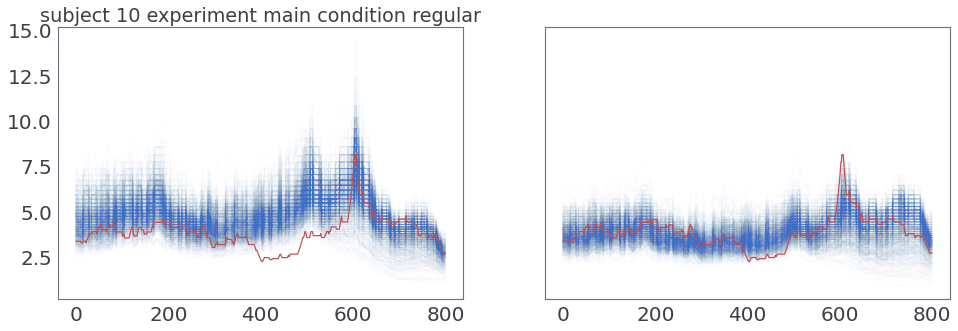

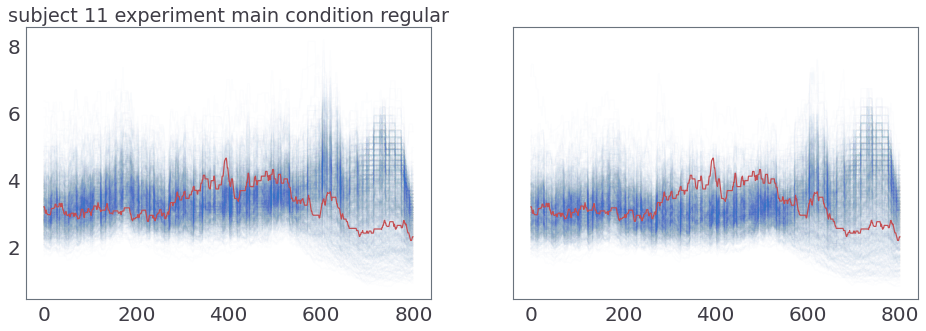

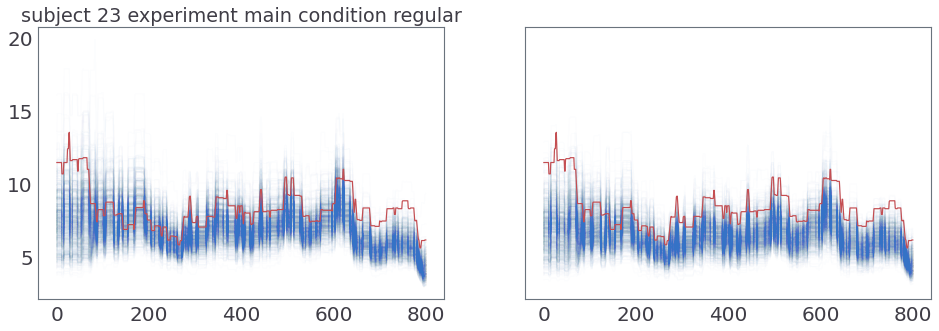

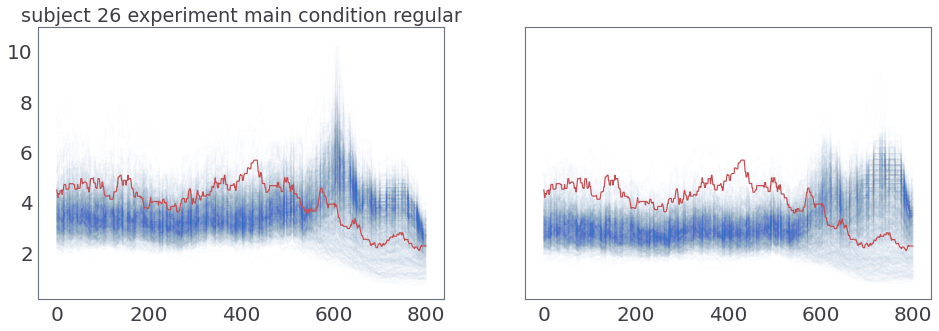

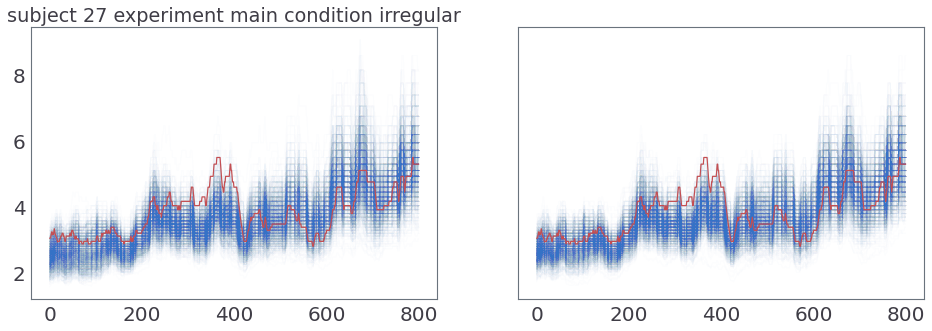

...

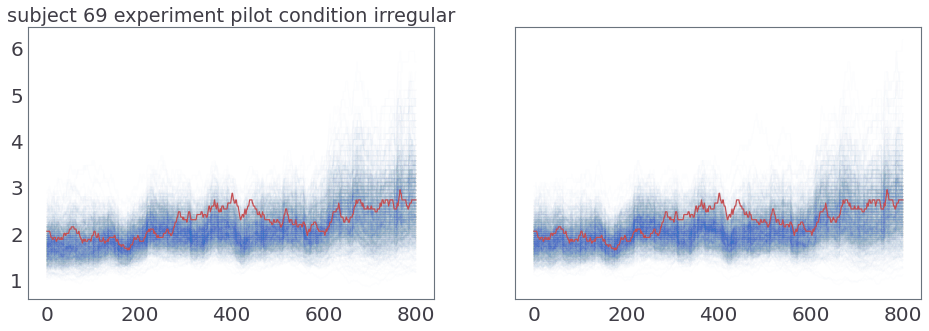

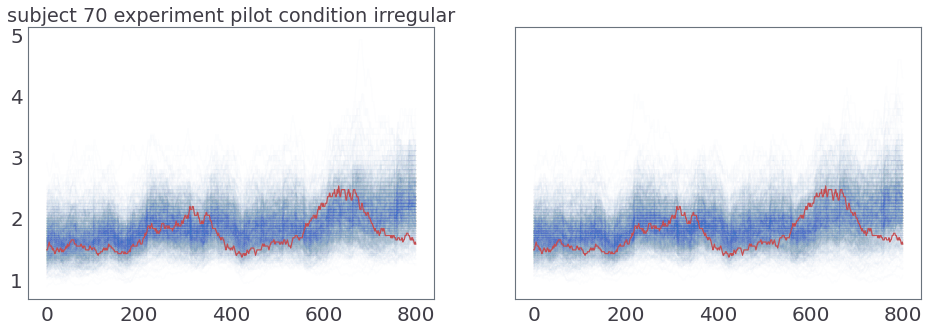

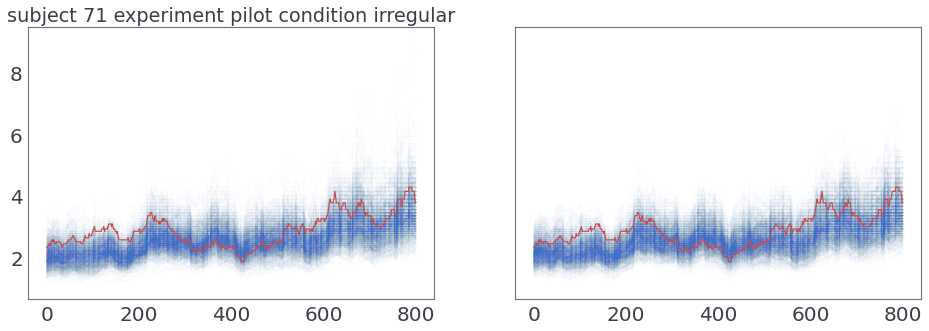

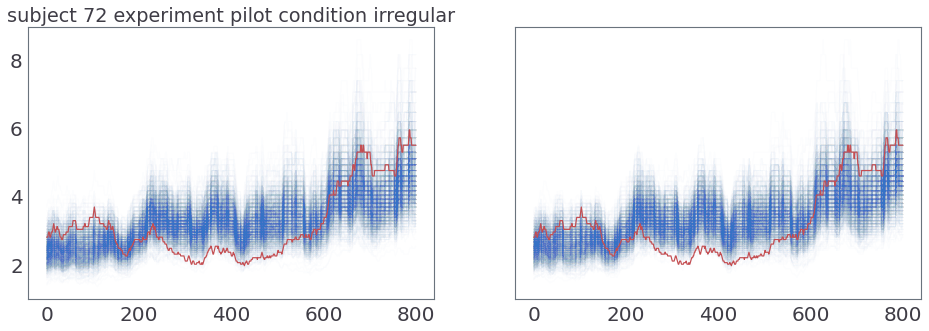

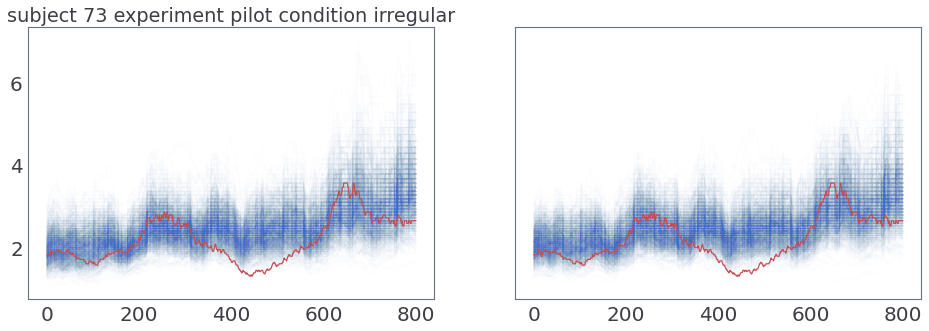

In [42]:
for n, m in enumerate(list(probs.argmax(-1))):
    if m > 0:
        fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharex=True, sharey=True)
        axes[0].plot(np.stack(res['perf'], 0)[n].T, 'b', alpha=0.01);
        axes[0].plot(perf_data[n], 'r')
        axes[0].set_title('subject {} experiment {} condition {}'.format(n, conditions['experiment'].loc[n], conditions['condition'].loc[n]))

        axes[1].plot(np.stack(res_hmm['perf'], 0)[n].T, 'b', alpha=0.01);
        axes[1].plot(perf_data[n], 'r')

/tmp/ipykernel_50484/923494117.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, 1, figsize=(16, 5), sharex=True, sharey=True)


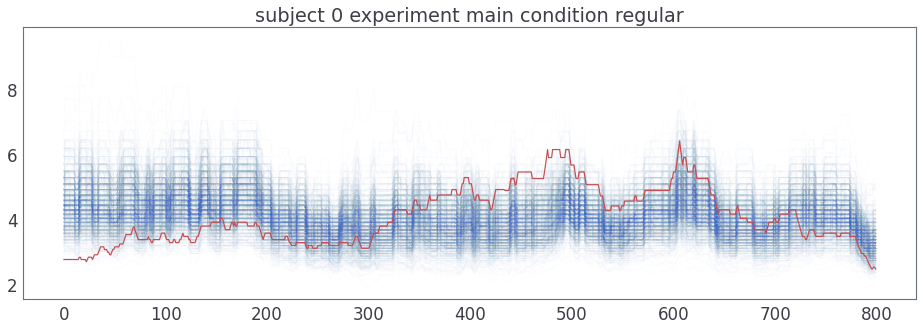

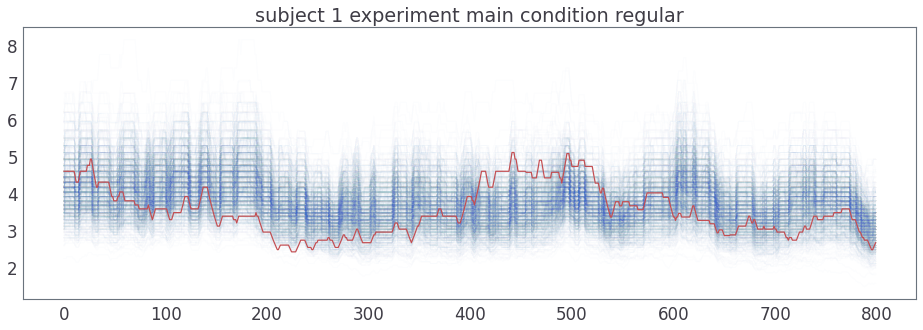

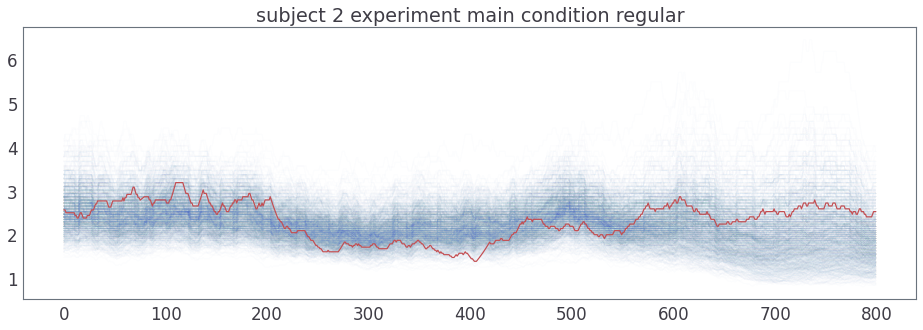

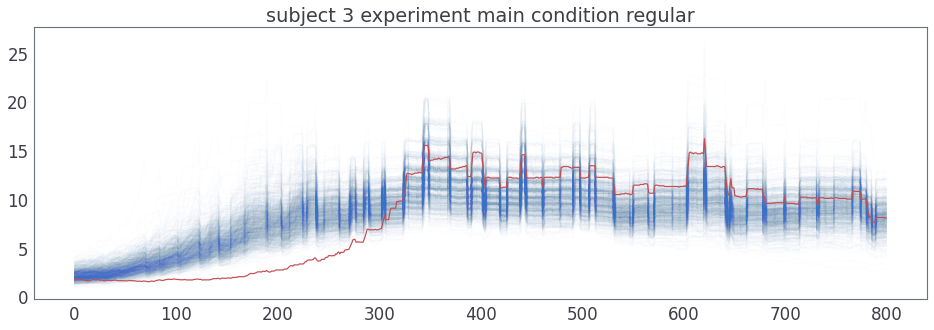

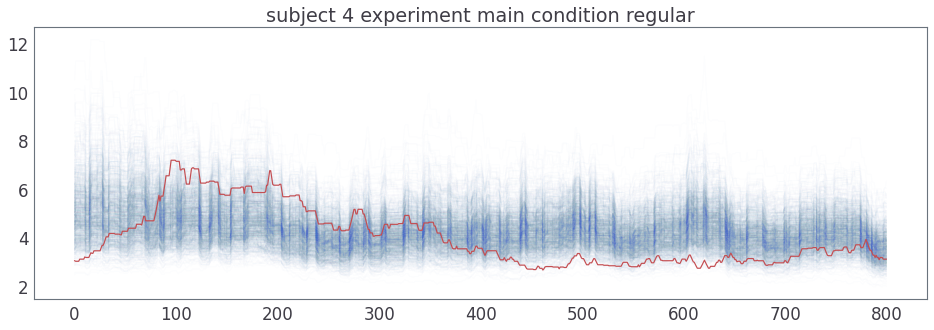

...

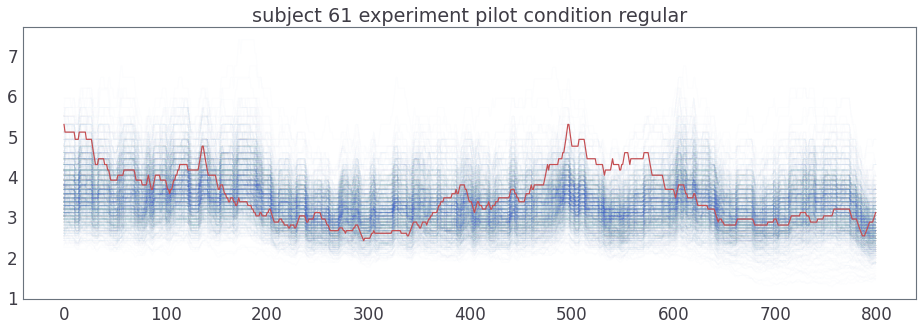

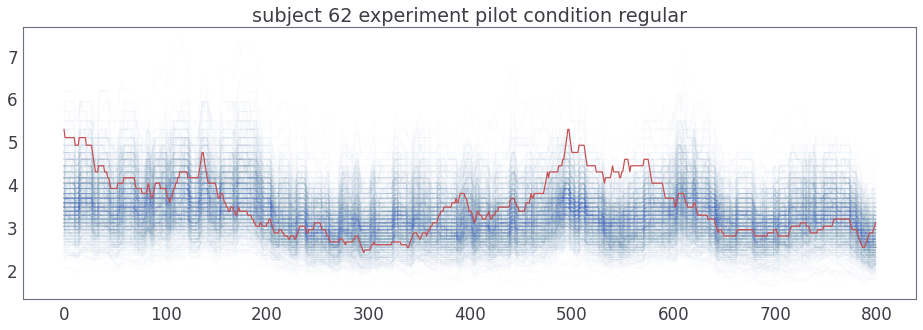

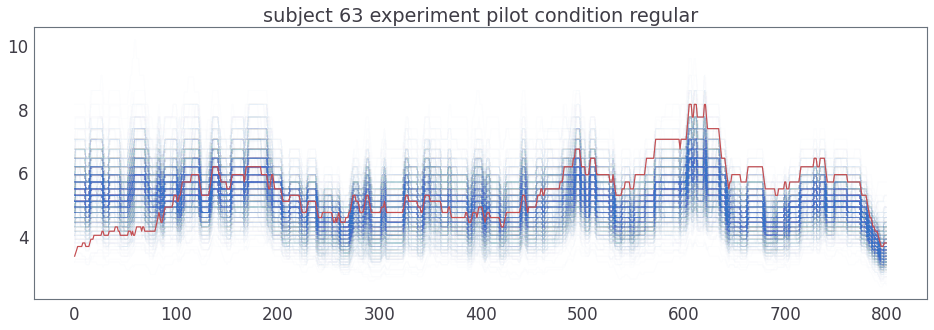

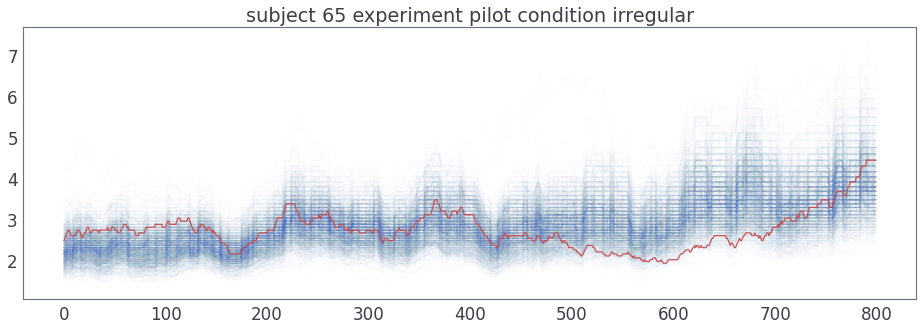

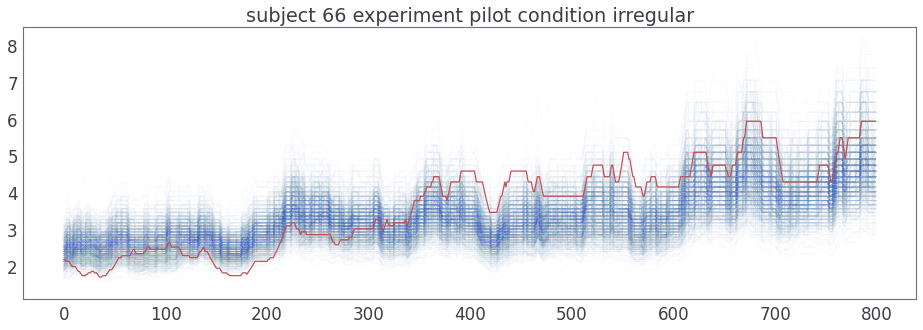

In [16]:
for n, m in enumerate(list(probs.argmax(-1))):
    if m == 0:
        fig, axes = plt.subplots(1, 1, figsize=(16, 5), sharex=True, sharey=True)
        axes.plot(np.stack(res_hmm['perf'], 0)[n].T, 'b', alpha=0.01);
        axes.plot(perf_data[n], 'r')
        axes.set_title('subject {} experiment {} condition {}'.format(n, conditions['experiment'].loc[n], conditions['condition'].loc[n]))

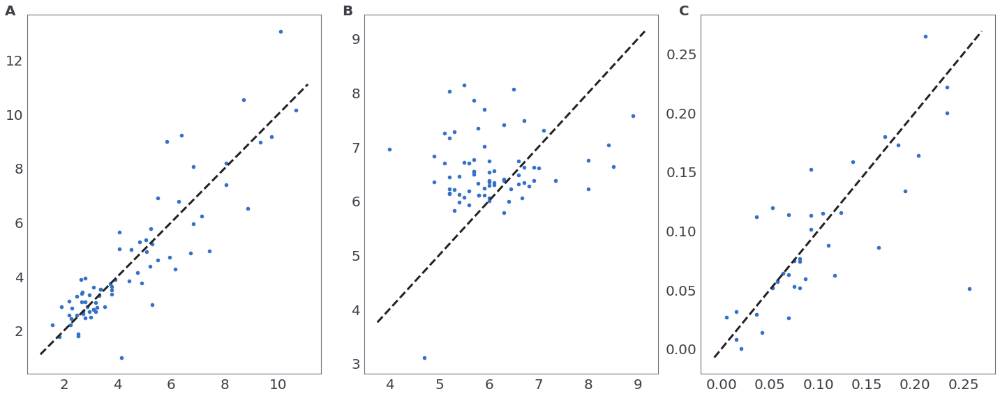

In [46]:
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)
plt.rc('axes', labelsize=20)
plt.rc('legend', fontsize=16)

fig, axes = plt.subplots(1, 3, figsize=(20, 8))

axes[0].plot(perf_data[:, -1], np.stack(res['perf'], 0).mean(-2)[:, -1], 'bo')
axes[0].plot(axes[0].get_xlim(), axes[0].get_xlim(), 'k--', lw=3)

axes[1].plot(tuc_data[:, -1], np.stack(res['tuc'], 0).mean(-2)[:, -1], 'bo')
axes[1].plot(axes[1].get_xlim(), axes[1].get_xlim(), 'k--', lw=3)

loc = odds_data[..., -1] > 0.
axes[2].plot(odds_data[loc, -1], np.stack(res['odds'], 0).mean(-2)[loc, -1], 'bo')
axes[2].plot(axes[2].get_xlim(), axes[2].get_xlim(), 'k--', lw=3)

for i in range(3):
    axes[i].text(-.075, 1., string.ascii_uppercase[i], transform=axes[i].transAxes, size=20, weight='bold')
    
fig.align_labels()
fig.tight_layout()

# fig.savefig('Fig2.pdf', transparent=True, dpi=300)

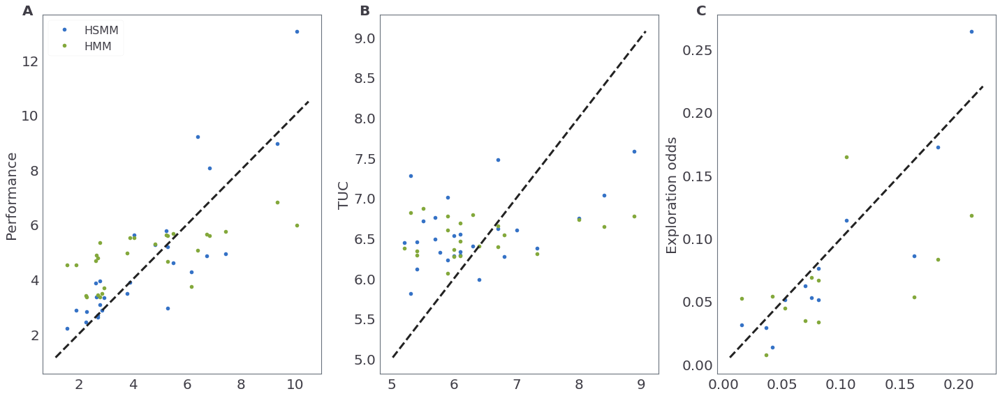

In [43]:
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)
plt.rc('axes', labelsize=20)
plt.rc('legend', fontsize=16)

perf = np.nanmean(correct_choices_data[-200:], -2)
perf = perf/(1 - perf)
states =  np.stack([ Sreg if c == 'regular' else Sirr for c in conditions['condition'] ])
tuc = trials_until_correct(np.nan_to_num(correct_choices_data).T, states, τ=3).T
tuc = np.nanmean(tuc[-200:], -2)

explore_odds =  np.nanmean(responses_data[-200:] == 2, -2)
explore_odds = explore_odds / (1 - explore_odds)

fig, axes = plt.subplots(1, 3, figsize=(20, 8))

not_hmm = probs.argmax(-1) != 0

axes[0].plot(perf_data[not_hmm, -1], np.stack(res['perf'], 0).mean(-2)[not_hmm, -1], 'o', label='HSMM')
axes[0].set_ylabel('Performance')

axes[0].plot(perf_data[not_hmm, -1], np.stack(res_hmm['perf'], 0).mean(-2)[not_hmm, -1], 'o', label='HMM')
axes[0].plot(axes[0].get_xlim(), axes[0].get_xlim(), 'k--', lw=3)

axes[0].legend()

axes[1].plot(tuc_data[not_hmm, -1], np.stack(res['tuc'], 0).mean(-2)[not_hmm, -1], 'o')
axes[1].plot(tuc_data[not_hmm, -1], np.stack(res_hmm['tuc'], 0).mean(-2)[not_hmm, -1], 'o')
axes[1].plot(axes[1].get_xlim(), axes[1].get_xlim(), 'k--', lw=3)
axes[1].set_ylabel('TUC')

loc = (odds_data[..., -1] > 0.) * not_hmm
axes[2].plot(odds_data[loc, -1], np.stack(res['odds'], 0).mean(-2)[loc, -1], 'o')
axes[2].plot(odds_data[loc, -1], np.stack(res_hmm['odds'], 0).mean(-2)[loc, -1], 'o')
axes[2].plot(axes[2].get_xlim(), axes[2].get_xlim(), 'k--', lw=3)
axes[2].set_ylabel('Exploration odds')

for i in range(3):
    axes[i].text(-.075, 1., string.ascii_uppercase[i], transform=axes[i].transAxes, size=20, weight='bold')
    
fig.align_labels()
fig.tight_layout()

# fig.savefig('Fig2.pdf', transparent=True, dpi=300)